In [1]:
from Utils import *

# DQN training

In [19]:
######################################## Example of how to train DQN: ########################################
# Initialise class with hyperparameters of your choice
DQN_exp = DQN_Experiments(EPSILON=0.5, 
                           EPSILON_FUNC="linear",
                           OPTIMISER_TYPE="Adam", 
                           ACTIVATION_TYPE="Relu",
                           N_BUFFER=100000, 
                           LR=0.001,
                           N_BATCH=20,
                           HIDDEN_LAYERS=[32, 16], #4d input, 2d output and 2 hidden layers of size 32, 16
                           EP_TG_UPDATE=2)

In [20]:
# Print strucutre of DQN
DQN_exp

DQN_Experiments(
  (layers): ModuleList(
    (0): Linear(in_features=4, out_features=32, bias=True)
    (1): Linear(in_features=32, out_features=16, bias=True)
    (2): Linear(in_features=16, out_features=2, bias=True)
  )
)

In [21]:
# Train DQN agent with hyperparameters
DQN_exp.DQN_train()

100%|███████████████████████████████████████████| 10/10 [15:10<00:00, 91.04s/it]


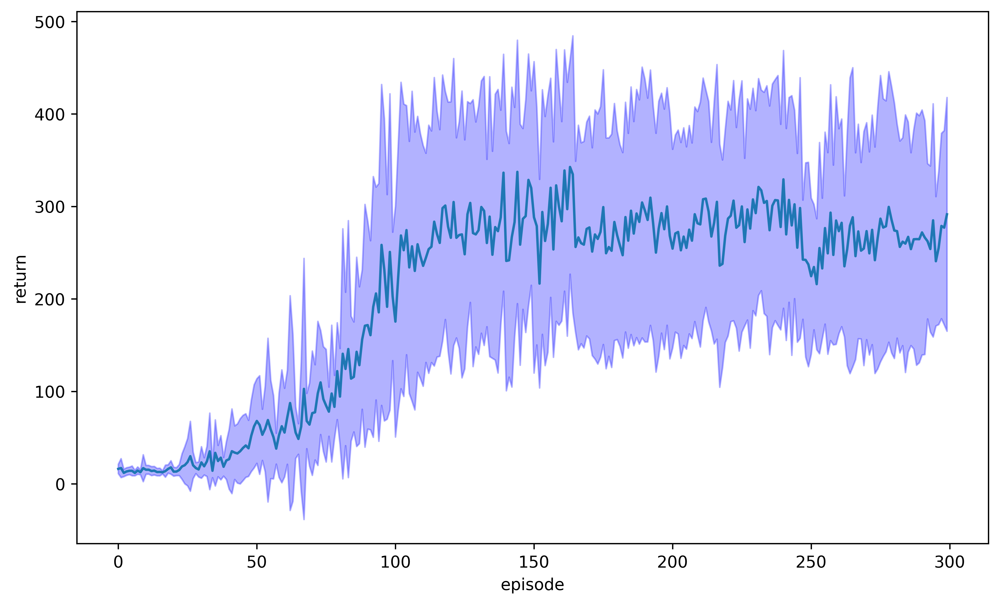

In [22]:
# Get run results (Q and policy)
DQN_result = DQN_exp.get_run_results()
DQN_policy = DQN_exp.get_policy_net()
# Plot DQN results
Plotting_DQN.plot_DQN_results(DQN_result)

# Hyperparameter Variation

Running experiments with layers: [[3], [20], [50], [100]]


  0%|                                                  | 0/10 [00:00<?, ?it/s]/Users/saracapdevilasole/opt/anaconda3/lib/python3.9/site-packages/gym/utils/passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):
100%|█████████████████████████████████████████| 10/10 [08:36<00:00, 51.64s/it]


Plotting results:


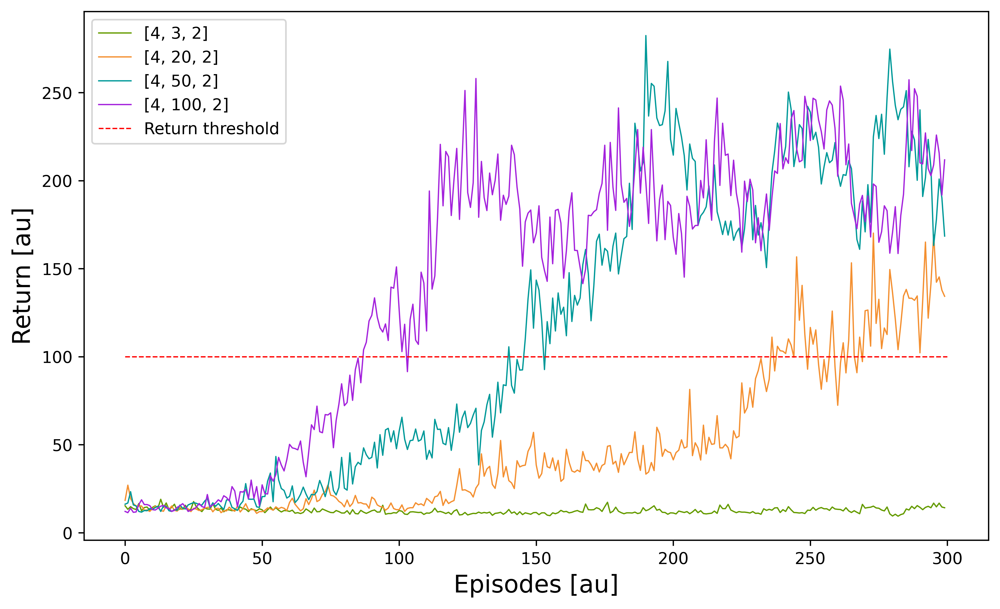

In [2]:
############################################# Hidden layer variation ##############################################
layers1 = [[3], [20], [50], [100]]
layers2 = [[3,2], [20,15], [50,40], [100,90]]
Hyperparameter_exploration.plot_h_layer_variation(layers1)

Running experiments with layers: [[3, 2], [20, 15], [50, 40], [100, 90]]


100%|█████████████████████████████████████████| 10/10 [13:08<00:00, 78.87s/it]


Plotting results:


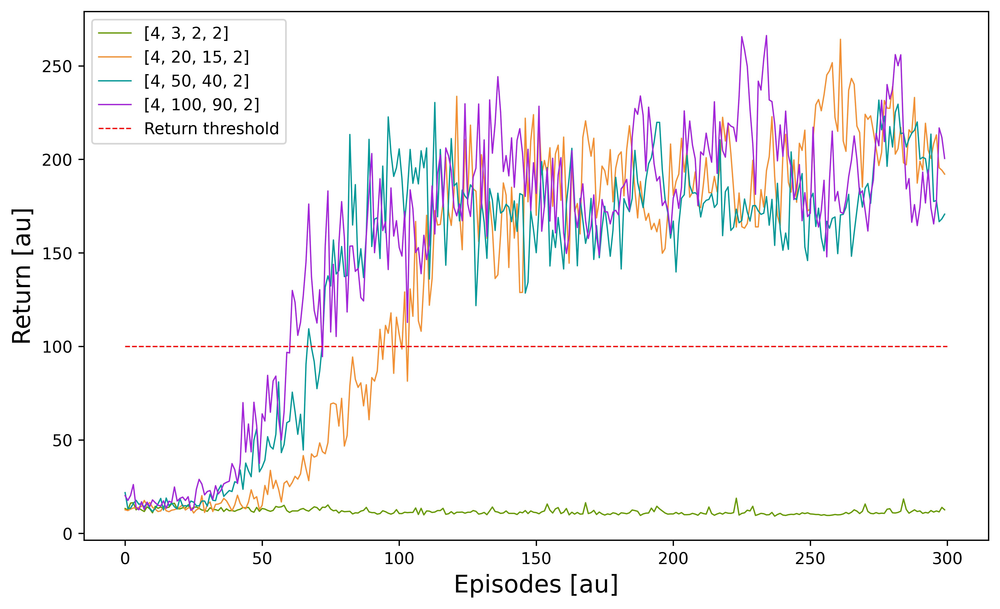

In [3]:
Hyperparameter_exploration.plot_h_layer_variation(layers2)

In [2]:
################################ Epsilon functions, with different epsilon values #################################
epsilons = [0.1, 0.5, 0.99]  
epsilon_func = ["const.", "exponential" ,"linear"]
Hyperparameter_exploration.plot_epsilon_variation(epsilon_func, epsilons)

Running 9 experiments with epsilon values: [0.1, 0.5, 0.99]


  0%|                                                  | 0/10 [00:00<?, ?it/s]/Users/saracapdevilasole/opt/anaconda3/lib/python3.9/site-packages/gym/utils/passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):
100%|█████████████████████████████████████████| 10/10 [08:43<00:00, 52.36s/it]


Plotting results:


In [5]:
######################################### Activation function variation ###########################################
activations = ["Relu", "LeakyRelu", "Sigmoid", "Tanh", "Softmax"]  #try different combinations of these
Hyperparameter_exploration.plot_activation_variation(activations)

100%|███████████████████████████████████████████| 10/10 [00:43<00:00,  4.35s/it]


In [3]:
############################################## Optimiser variation ################################################
optimiser_types = ["SGD", "SGD momentum", "Adam", "NAdam", "RAdam"]
r = Hyperparameter_exploration.optimiser_variation(optimiser_types)

100%|███████████████████████████████████████████| 10/10 [09:30<00:00, 57.07s/it]


Plotting results:
Plotting results:


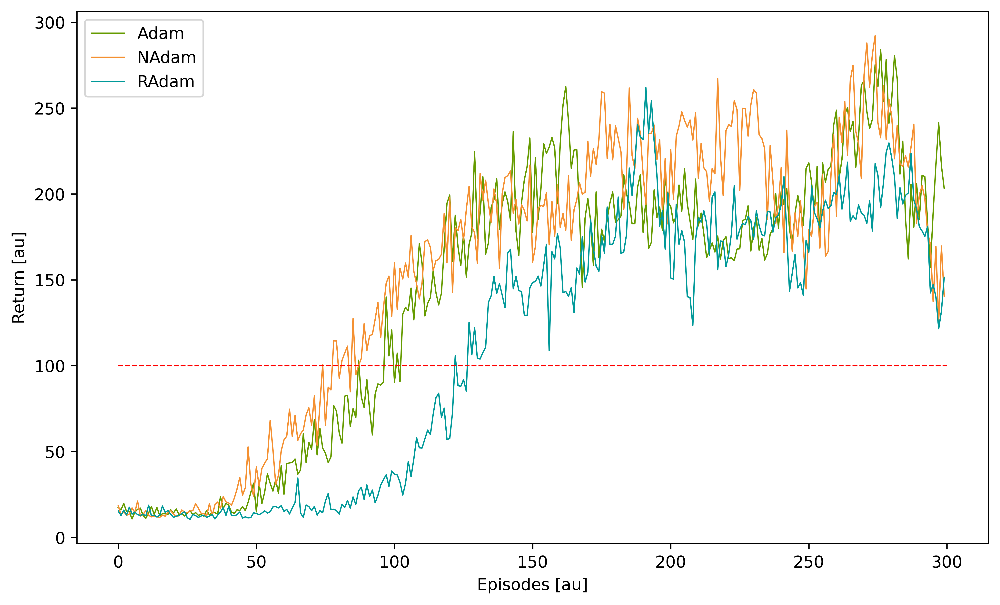

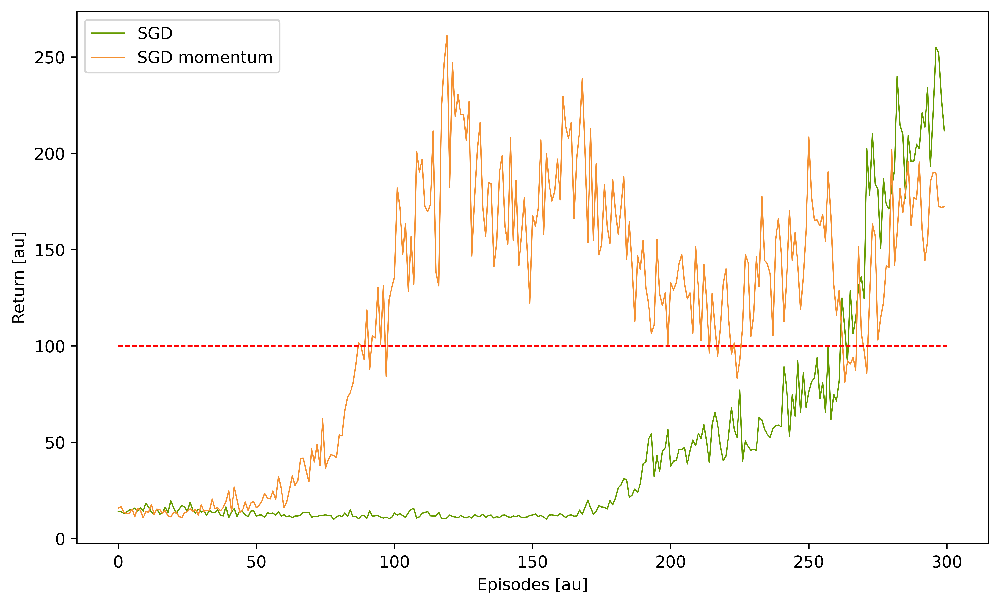

In [14]:
# split into two different plots for clarity
Hyperparameter_exploration.plot_optimiser_variation(optimiser_types[2:], r[2:])
Hyperparameter_exploration.plot_optimiser_variation(optimiser_types[:2], r[:2])

In [3]:
######################################### Buffer Size variation ###########################################
buffer_types = [10**i for i in range(2,7)]
b_r, t = Hyperparameter_exploration.buffer_variation(buffer_types)

100%|███████████████████████████████████████████| 10/10 [10:40<00:00, 64.05s/it]


Plotting results:


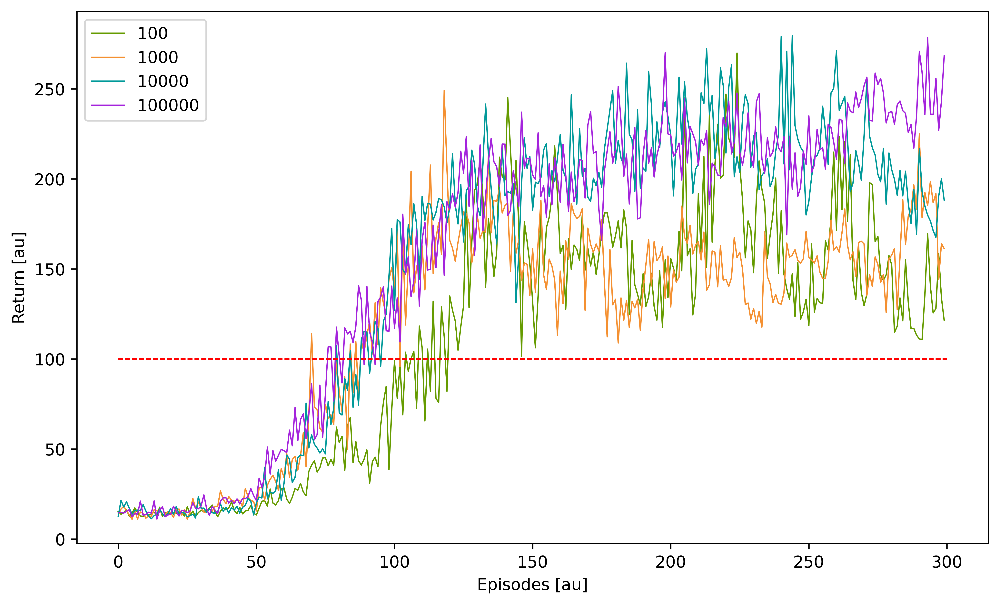

In [12]:
# Plot only first 4 buffer sizes for clarity
Hyperparameter_exploration.plot_buffer_variation(buffer_types[:4], b_r[:4])

In [2]:
# The rest of parameters are extracted from literature

# Optuna Study

In [ ]:
################################################# OPTUNA STUDY ####################################################
#### Now that we have explored, lets run an optuna study with more precise ranges in mind:
best_params = Optuna_Study.start_study(n_trials=30) # Takes a long time

# Optimised learning curve

In [2]:
# Extract Best Trial manually:
"""
Trial 1 finished with values: [270.0, 233.0] and params:
"""
optimised_params = {'EPSILON': 0.3, 
                    'N_BUFFER': 60000, 
                    'LR': 0.001, 
                    'N_BATCH': 20, 
                    'layer_0_size': 140, 
                    'layer_1_size': 80, 
                    'EP_TG_UPDATE': 2}

# or use: optimised_params = best_params[1][0] # Meaning of indices [1][0]:
                                               #'1': Extracts run with highest number of mean-std count over 100 
                                                   #(change to '0' if you want the highest number of mean counts over 100)
                                               #'0': Extracts the parameters of the best run

In [3]:
unoptimised_params = {'EPSILON': 1, 
                      'EPSILON_FUNC': "const.",
                      'OPTIMISER_TYPE': "SGD",
                      'ACTIVATION_TYPE': "Relu",
                      'N_BUFFER': 1, 
                      'LR': 1, 
                      'N_BATCH': 1, 
                      'HIDDEN_LAYERS': [1], 
                      'EP_TG_UPDATE': 1}

In [4]:
# Initialise the optimised DQN
DQN_exp = DQN_Experiments(EPSILON=optimised_params['EPSILON'], 
                           EPSILON_FUNC="linear",
                           OPTIMISER_TYPE="NAdam", 
                           ACTIVATION_TYPE="LeakyRelu",
                           N_BUFFER=optimised_params['N_BUFFER'], 
                           LR=optimised_params['LR'],
                           N_BATCH=optimised_params['N_BATCH'],
                           HIDDEN_LAYERS=[optimised_params['layer_0_size'], optimised_params['layer_0_size']],
                           EP_TG_UPDATE=optimised_params['EP_TG_UPDATE'])

In [5]:
# Initialise the unoptimised DQN
DQN_exp_unopt = DQN_Experiments(EPSILON=unoptimised_params['EPSILON'], 
                                EPSILON_FUNC=unoptimised_params['EPSILON_FUNC'],
                                OPTIMISER_TYPE=unoptimised_params['OPTIMISER_TYPE'], 
                                ACTIVATION_TYPE=unoptimised_params['ACTIVATION_TYPE'],
                                N_BUFFER=unoptimised_params['N_BUFFER'], 
                                LR=unoptimised_params['LR'],
                                N_BATCH=unoptimised_params['N_BATCH'],
                                HIDDEN_LAYERS=unoptimised_params['HIDDEN_LAYERS'],
                                EP_TG_UPDATE=unoptimised_params['EP_TG_UPDATE'])

In [6]:
# Run optimised DQN
DQN_exp.DQN_train()

  0%|                                                  | 0/10 [00:00<?, ?it/s]/Users/saracapdevilasole/opt/anaconda3/lib/python3.9/site-packages/gym/utils/passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):
100%|████████████████████████████████████████| 10/10 [34:47<00:00, 208.78s/it]


In [7]:
# Run unoptimised DQN
DQN_exp_unopt.DQN_train()

100%|█████████████████████████████████████████| 10/10 [00:50<00:00,  5.09s/it]


In [8]:
# Get results for both DQNs
DQN_result = DQN_exp.get_run_results()
DQN_unopt = DQN_exp_unopt.get_run_results()

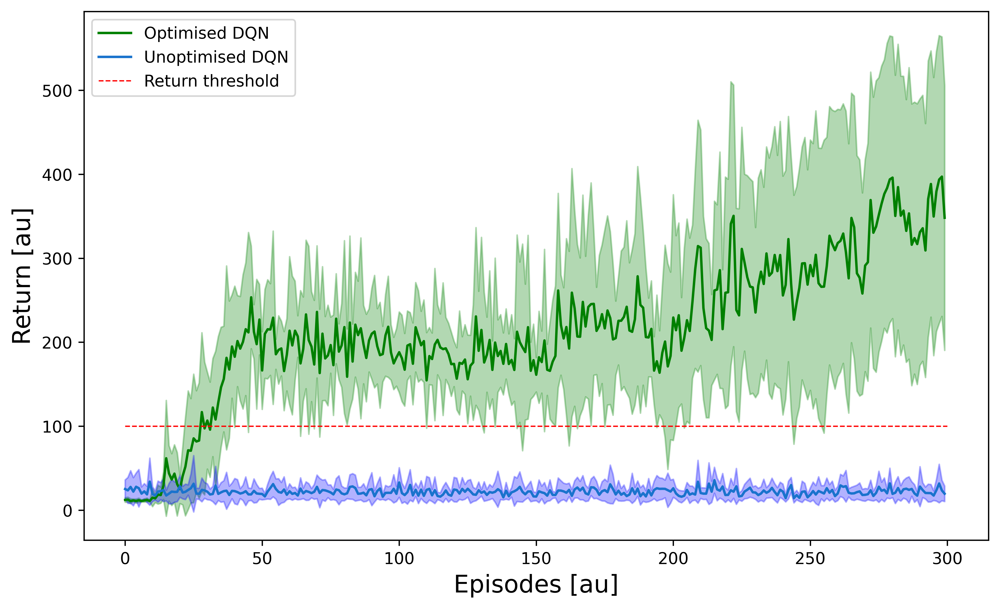

In [9]:
# Plot both DQNs
Plotting_DQN.plotQ1_both_DQN_results(DQN_result, DQN_unopt)

# DQN policy and Q-values

In [10]:
# Get Policy from DQN 
DQN_policy = DQN_exp.get_policy_net() # length = N_runs

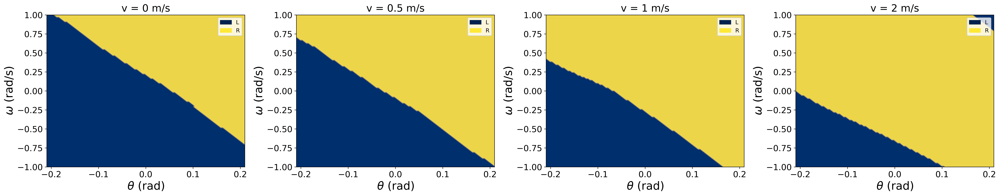

In [14]:
############################################### Visualise DQN Policy ##############################################
# Plot average policy 
v_array = [0, 0.5, 1, 2] # set velocity array
Plotting_DQN.plot_q2_policy(DQN_policy, v_array, q=False)

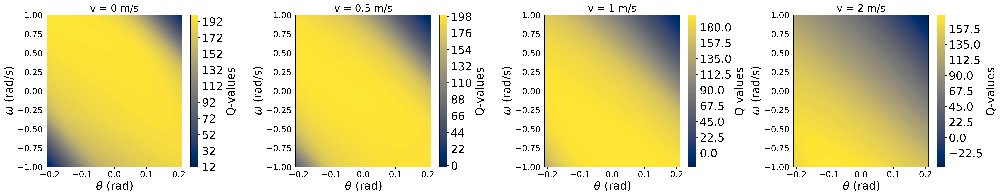

In [13]:
############################################# Visualise DQN Q_values ##############################################
# Plot average Q values
Plotting_DQN.plot_q2_policy(DQN_policy, v_array, q=True)